In [1]:
# Import libraries
import numpy as np
import math
import random
import pandas as pd

import scipy.stats as stats
from statsmodels.stats.multitest import multipletests

import statsmodels.api as sm # linear regression

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

import scanpy as sc
from gprofiler import GProfiler

import os

# Directory path
myDir = "/Users/junjie/Desktop/OneDrive - The University of Chicago (1)/Python"
os.chdir(myDir)
import ProxseqClasses as PC
import calculateweightedPPI as WPPI
import ProxseqFunctions as PF

#*****
mpl.rcdefaults()
# Set font to be arial
mpl.rc('font', **{'sans-serif':'Arial', 'size':12})
mpl.rcParams['mathtext.rm'] = 'sans' # to have non-italic greek letter, use r'$\mathrm{\alpha}$', does NOT work with f-string
mpl.rcParams['axes.titlesize'] = 12
# Set default tick size
mpl.rcParams['xtick.major.size'] = 5.5
mpl.rcParams['ytick.major.size'] = 5.5
mpl.rcParams['xtick.minor.size'] = 2.5
mpl.rcParams['ytick.minor.size'] = 2.5
# Default legend settings
mpl.rcParams['legend.fancybox'] = False
mpl.rcParams['legend.edgecolor'] = 'k'

#to store text as text, not as path
new_rc_params = {'text.usetex': False,
                 "svg.fonttype": 'none'}
mpl.rcParams.update(new_rc_params)
#*****
# Seed number
np.random.seed(2025)
random.seed(2025)

In [2]:
adata = sc.read_h5ad("GPS/20250221/adata_rna.h5ad")
adata_adt = sc.read_h5ad("GPS/20250221/adata_adt.h5ad")

In [3]:
#read singleR and azimuth annotation
singler = pd.read_csv("GPS/20250221/rna_singleR_annotations.csv", index_col=0)
azimuth = pd.read_csv("GPS/20250221/azimuth_pred.tsv", sep='\t',index_col=0)

In [3]:
final_annotation = pd.read_csv('GPS/20250521/donor2_annotation_20250602_latest.csv', index_col=0)

In [4]:
adata = adata[final_annotation.index].copy()

In [5]:
adata.obs['main_annotation'] = final_annotation['main_annotation']
adata.obs['fine_annotation'] = final_annotation['manual_annotation']

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

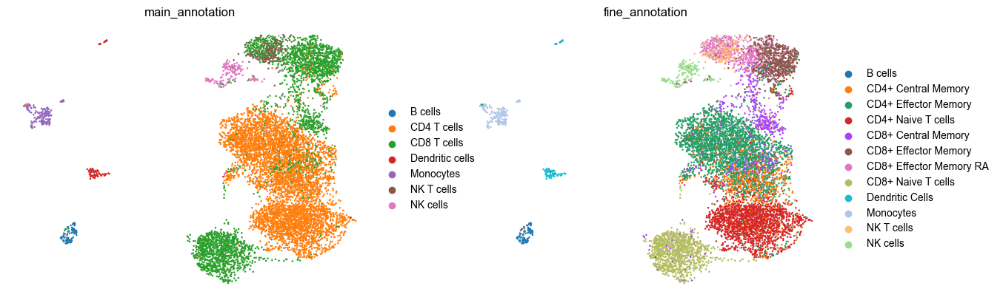

In [30]:
sc.pl.umap(adata, color=['main_annotation','fine_annotation'],ncols=2, frameon=False, legend_fontweight='normal', legend_fontsize=10, show=False)
plt.savefig(save_dir + 'donor2_pbmc_umap.svg', format='svg', bbox_inches='tight', pad_inches=0)

In [8]:
lectin_raw = pd.read_csv('GPS/20250221/pbmc_raw_lectin_df.csv', index_col=0)

In [25]:
adata.obsm['X_umap']

array([[13.111047 ,  6.1751075],
       [ 9.452256 ,  7.9437213],
       [10.279714 , 15.151563 ],
       ...,
       [ 8.284271 , -3.7494426],
       [ 8.508743 , -3.0943618],
       [ 8.71854  ,  6.4759197]], dtype=float32)

In [9]:
# Define the CLR normalization function adapted from Seurat
def clr_function(column):
    # Filter out zeros for log transformation and only include positive values
    positive_values = column[column > 0]
    
    # Calculate the mean of log-transformed positive values
    mean_log = np.sum(np.log1p(positive_values)) / len(column)
    
    # Normalize by subtracting the exponential mean from each log-transformed value
    clr_values = np.log1p(column / np.exp(mean_log))
    
    return clr_values

In [10]:
clr_lectin = lectin_raw.apply(clr_function,axis=0)
clr_lectin = clr_lectin.T

In [11]:
common_cells = clr_lectin.index.intersection(adata.obs_names)
clr_lectin = clr_lectin.loc[common_cells]

In [12]:
adata.obsm["lectin"] = clr_lectin
for lectin in adata.obsm["lectin"].columns:
    new_key = f"LDT_{lectin}"
    # Add to .obs with the prefixed name
    adata.obs[new_key] = adata.obsm["lectin"][lectin]

In [13]:
save_dir = '/Users/junjie/Library/CloudStorage/OneDrive-TheUniversityofChicago(1)/Experimental data/Glycan_proxseq/manuscript/fig_update_v2/'

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


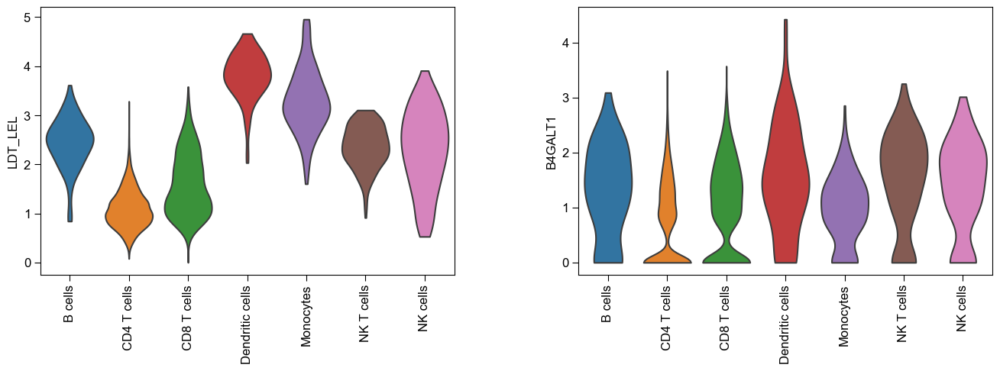

In [15]:
# Plot violin for only control condition
sc.pl.violin(
    adata,
    keys=['LDT_LEL', 'B4GALT1'],
    groupby="main_annotation",
    stripplot=False,
    show=False,
    rotation=90
)
plt.savefig(save_dir + 'donor2_LEL_B4GALT1_violin_cell.svg', format='svg', bbox_inches='tight', pad_inches=0)

In [18]:
## Copy only where obs_names overlap; others will get NaN
adata_adt.obs["main_annotation"] = adata.obs["main_annotation"].reindex(adata_adt.obs_names)

In [20]:
adt_marker_dict = {
    "B cells": ["CD19", "CD20"], 
    "CD4 T cells": ["CD3","CD4"],
    "CD8 T cells": ["CD3","CD8"],
    "Dendritic cells": ["HLADR"],
    "Monocytes": ["CD14", "CD11b"],
    "NK T cells": ["CD3", "CD56"],
    "NK cells": ["CD56", "CD16"]
}

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_matrixplot.py:144: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  values_df = self.obs_tidy.groupby(level=0).mean()


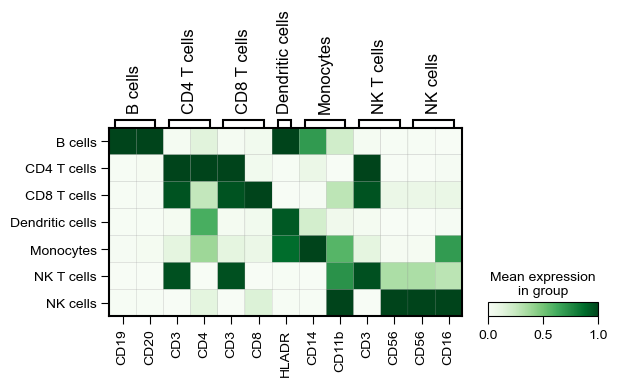

In [22]:
# Plot matrixplot only for control cells
sc.pl.matrixplot(
    adata_adt,
    adt_marker_dict,
    groupby="main_annotation",
    standard_scale='var',
    cmap='Greens',
    show=False
)
plt.savefig(save_dir+'de_adt_matrixplot_donor2.svg', format='svg', bbox_inches='tight',pad_inches=0)

In [4]:
adata_adt.var_names = ['AB_' + var for var in adata_adt.var_names]

In [5]:
adata.obsm["antibody"] = adata_adt.X  # Add protein data
adata.uns["antibody_var_names"] = np.array(adata_adt.var_names)  # Store protein names

In [6]:
# Convert protein expression matrix to a DataFrame
protein_df = pd.DataFrame(adata_adt.X,  # Convert sparse to dense if needed
                          index=adata_adt.obs_names,  # Keep cell names
                          columns=adata_adt.var_names)  # Use protein names as columns

# Add protein expression to adata.obs
adata.obs = pd.concat([adata.obs, protein_df], axis=1)

AnnData object with n_obs × n_vars = 9550 × 37
    obs: 'rna_annotation_l1', 'rna_annotation_l2', 'leiden_adt', 'adt_annotation_level1', 'adt_annotation_level2', 'singler_ann_l1', 'singler_ann_l2', 'azimuth_ann_l1', 'azimuth_ann_l2', 'gmm_annotation', 'leiden_adt_cd4'
    uns: 'adt_annotation_level1_colors', 'adt_annotation_level2_colors', 'azimuth_ann_l1_colors', 'azimuth_ann_l2_colors', 'dendrogram_leiden_adt', 'gmm_annotation_colors', 'leiden', 'leiden_adt_cd4_colors', 'leiden_adt_colors', 'neighbors', 'pca', 'rna_annotation_l1_colors', 'rna_annotation_l2_colors', 'singler_ann_l1_colors', 'singler_ann_l2_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [17]:
adata

AnnData object with n_obs × n_vars = 8989 × 4000
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'rna_leiden_level1', 'annotation_level1', 'annotation_level2', 'main_annotation', 'fine_annotation', 'LDT_PHA-L', 'LDT_ConA', 'LDT_PNA', 'LDT_MAL-I', 'LDT_MAL-II', 'LDT_SNA', 'LDT_DBA', 'LDT_ECA', 'LDT_AAL', 'LDT_DSL', 'LDT_LEL', 'LDT_GSL-II', 'LDT_Galectin-3'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rna_leiden_level1_colors', 'umap', 'main_annotation_colors'
    obsm: 'X_pca', 'X_umap', 'lectin'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [7]:
adata.obs["adt_annotation_level1"] = adata_adt.obs["adt_annotation_level1"]
adata.obs["adt_annotation_level2"] = adata_adt.obs["adt_annotation_level2"]
#map annotations
adata.obs['singler_ann_l1'] = singler['singleR_ann_l1']
adata.obs['singler_ann_l2'] = singler['singleR_ann_l2']
adata.obs['azimuth_ann_l1'] = azimuth['predicted.celltype.l1']
adata.obs['azimuth_ann_l2'] = azimuth['predicted.celltype.l2']

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/sca

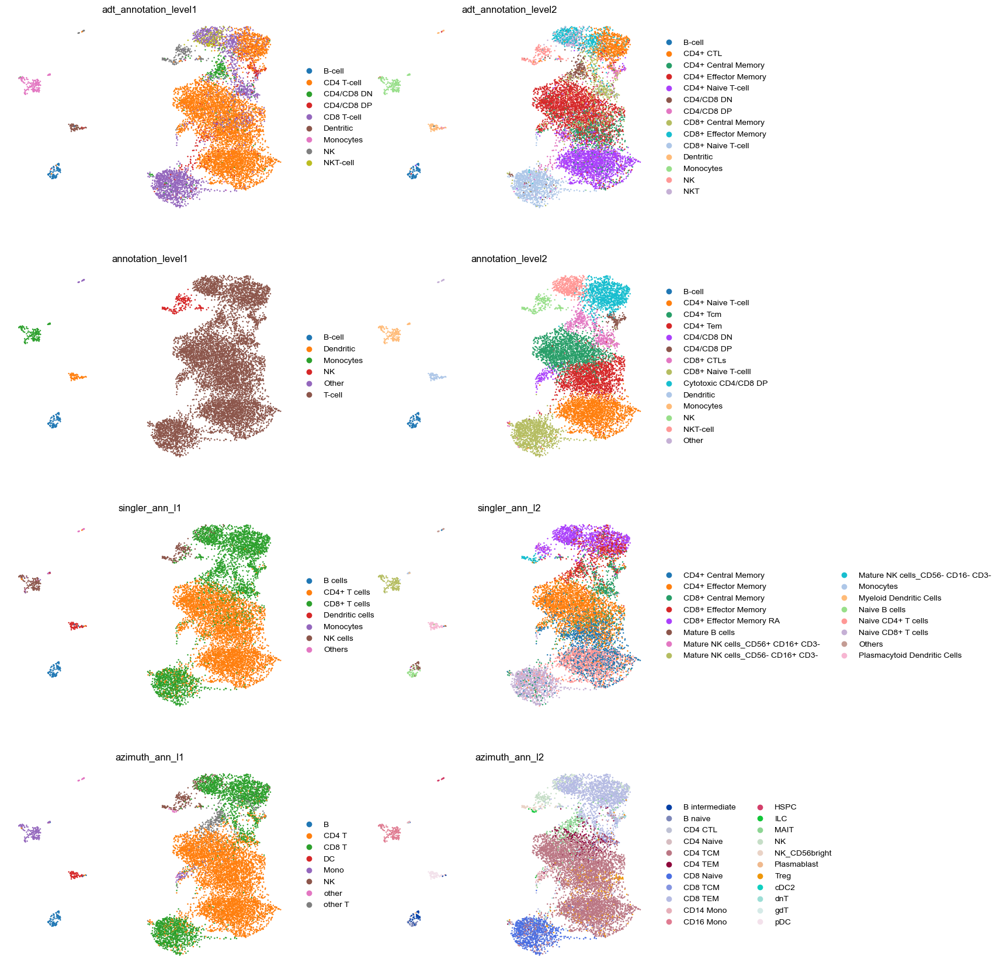

In [8]:
sc.pl.umap(adata, color=['adt_annotation_level1','adt_annotation_level2','annotation_level1','annotation_level2',
                        'singler_ann_l1','singler_ann_l2','azimuth_ann_l1','azimuth_ann_l2'],ncols=2, frameon=False, legend_fontweight='normal', legend_fontsize=10)

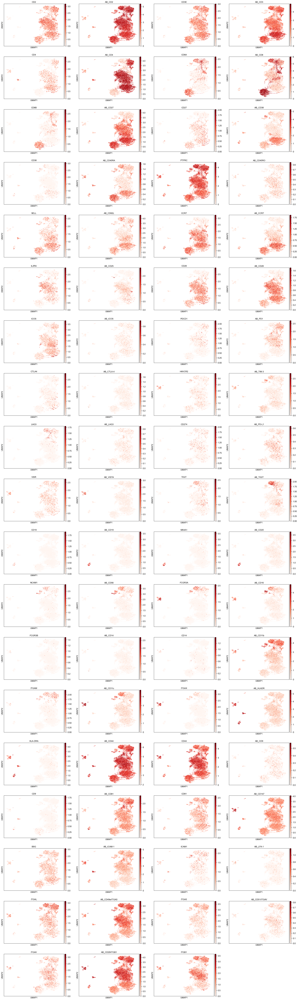

In [51]:
mixed_list = [
    "CD2", "AB_CD2", "CD3E", "AB_CD3", "CD4", "AB_CD4", "CD8A", "AB_CD8", 
    "CD8B", "AB_CD27", "CD27", "AB_CD38", "CD38", "AB_CD45RA", "PTPRC", "AB_CD45RO", 
    "SELL", "AB_CD62L", "CCR7", "AB_CCR7", "IL2RA", "AB_CD25", "CD28", "AB_CD28", 
    "ICOS", "AB_ICOS", "PDCD1", "AB_PD1", "CTLA4", "AB_CTLA-4", "HAVCR2", "AB_TIM-3", 
    "LAG3", "AB_LAG3", "CD274", "AB_PD-L1", "VSIR", "AB_VISTA", "TIGIT", "AB_TIGIT", 
    "CD19", "AB_CD19", "MS4A1", "AB_CD20", "NCAM1", "AB_CD56", "FCGR3A", "AB_CD16", 
    "FCGR3B", "AB_CD14", "CD14", "AB_CD11b", "ITGAM", "AB_CD11c", "ITGAX", "AB_HLADR", 
    "HLA-DRA", "AB_CD44", "CD44", "AB_CD9", "CD9", "AB_CD81", "CD81", "AB_CD147", 
    "BSG", "AB_ICAM-1", "ICAM1", "AB_LFA-1", "ITGAL", "AB_CD49e/ITGA5", "ITGA5", "AB_CD51/ITGAV", 
    "ITGAV", "AB_CD29/ITGB1", "ITGB1"
]
sc.pl.umap(adata,color=mixed_list, color_map='Reds')

In [23]:
#correlation between rna and protein 
def calculate_correlation(gene, protein, adata_rna, df_protein, method='pearson'):
    gene_expression = adata_rna[:, gene].layers['counts'].A.flatten()
    protein_expression = df_protein.loc[:, protein].values.flatten()
    if method == 'pearson':
        corr = stats.pearsonr(gene_expression, protein_expression)[0]
    elif method == 'spearman':
        corr = stats.spearmanr(gene_expression, protein_expression)[0]
    return corr

def scatterplot_corr(gene, protein, adata_rna, df_protein, corr, method='log2', ax=None):
    gene_expression = adata_rna[:, gene].layers["counts"].A.flatten()
    protein_expression = df_protein.loc[:, protein].values.flatten()
    if ax is None:
        fig, ax = plt.subplots(figsize=(4, 4))
    if method == 'log2':
        ax.scatter(np.log2(gene_expression), np.log2(protein_expression), c='grey', s=15)
    
    elif method == 'raw':
        ax.scatter(gene_expression, protein_expression, c='grey', s=15)
    ax.text(0.01,0.95, f"corr = {corr:.2f}", transform=ax.transAxes)
    ax.set_xlabel(f'Log2 Expression of {gene} gene')
    ax.set_ylabel(f'Log2 Expression of {protein} protein')
    ax.set_title(f'Correlation between {gene} gene and {protein} protein')
    return ax

In [11]:
#read raw protein_df
df_protein = pd.read_csv('GPS/20250221/pbmc_raw_protein_df.csv', index_col=0)

In [19]:
adata2 = sc.read_h5ad('GPS/20250221/adata_all_gene.h5ad')

In [24]:
# Step 1: Find the intersection of shared barcodes
shared_barcodes = df_protein.columns.intersection(adata2.obs_names)

# Step 2: Subset and reorder both
df_protein = df_protein[shared_barcodes]
adata2 = adata2[shared_barcodes]

/var/folders/3m/mdf183dx4b79fpz1v51zf93w0000gn/T/ipykernel_31013/3201864834.py:17: RuntimeWarning: divide by zero encountered in log2
  ax.scatter(np.log2(gene_expression), np.log2(protein_expression), c='grey', s=15)


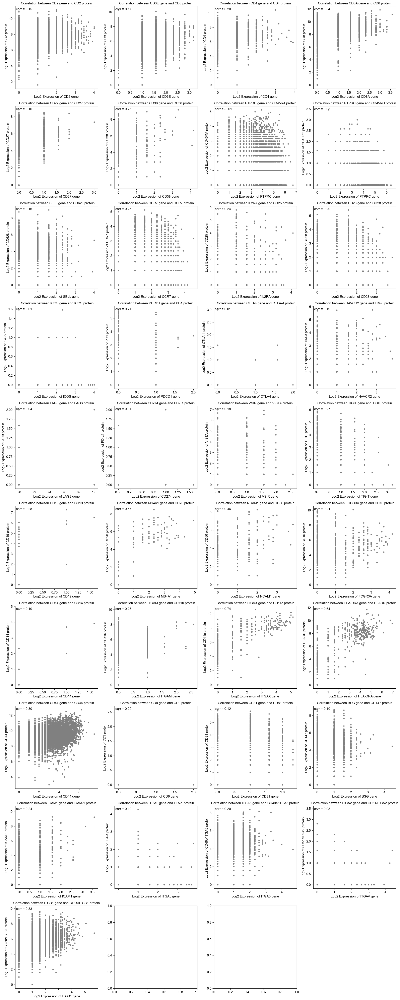

In [25]:
gene_list = [
    "CD2", "CD3E", "CD4", "CD8A", "CD27", "CD38", "PTPRC", "PTPRC", 
    "SELL", "CCR7", "IL2RA", "CD28", "ICOS", "PDCD1", "CTLA4", "HAVCR2", 
    "LAG3", "CD274", "VSIR", "TIGIT", "CD19", "MS4A1", "NCAM1", "FCGR3A", 
     "CD14", "ITGAM", "ITGAX", "HLA-DRA", "CD44", "CD9", "CD81", 
    "BSG", "ICAM1", "ITGAL", "ITGA5", "ITGAV", "ITGB1"]

protein_list = list(df_protein.index)
fig, ax = plt.subplots(ncols=4, nrows=10, figsize=(20,50))
for i, (gene, protein) in enumerate(zip(gene_list, protein_list)):
    row, col = divmod(i, 4)
    ax[row,col] = scatterplot_corr(gene, protein, adata2, df_protein.T, calculate_correlation(gene, protein, adata2, df_protein.T), ax=ax[row,col])
        # Hide empty subplots
    ax[-1, -1].axis('off')
    fig.tight_layout()